# Predicting Housing Prices in California
***
<br>
Welcome to the California Housing Prices Analysis! In this project, we are going to use the 1990 California Census dataset to study and try to understand how the different attributes can make the house prices get higher or lower. How does the location impact? How about the size of the house? The age? <br> <br>
This dataset has a lot of information that can help us. The main goal of this project is to build a Machine Learning Model in python that can learn from this data and make predictions of the median price of a house in any district, given all the other metrics provided in the dataset.

<br><br>

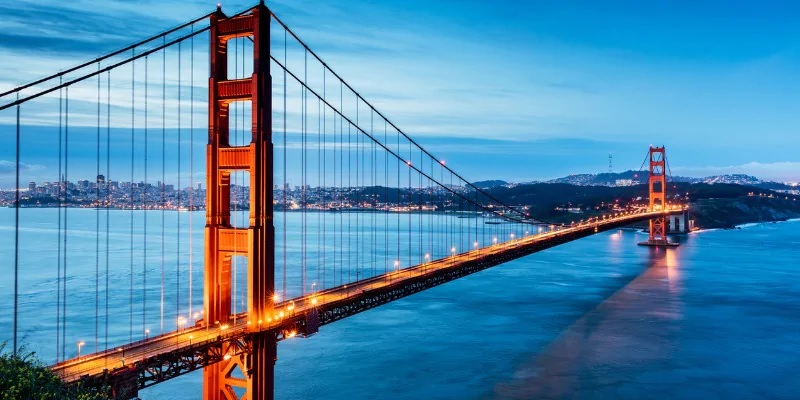

<br>

In [1]:
## Importing Libraries

import pandas as pd
import numpy as np
from scipy.stats import loguniform
import warnings
import random

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from autoviz.AutoViz_Class import AutoViz_Class

from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.pipeline import Pipeline


from xgboost import XGBRegressor
from skopt import gp_minimize

warnings.filterwarnings('ignore')
%matplotlib inline

seed = 123


def run_and_evaluate_model(df, estimator, std_scaler = False, log = False, seed = seed):
    
    if log == True:
        y = df['log_median_house_value']
        X = df.drop(['median_house_value', 'log_median_house_value'], axis = 1)
    else:
        y = df['median_house_value']
        X = df.drop(['median_house_value'], axis = 1)
        
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=seed)
    
    
    if std_scaler == True:
        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)
    try:
        modelo = estimator(random_state = seed)
    except:
        modelo = estimator()
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)
    
    if log == True:
        y_pred = np.exp(y_pred)
        y_test = np.exp(y_test)
    
    r2 = metrics.r2_score(y_test, y_pred).round(3)
    mse = round(np.sqrt(mean_squared_error(y_test,y_pred)),0)    
    
    return r2, mse

def run_and_evaluate_model_cv(df, modelo, seed = seed):
    
    y = df['median_house_value']
    X = df.drop(['median_house_value'], axis = 1)
        
    modelo.fit(X, y)
    folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
    scores = cross_val_score(modelo, X, y, cv=folds)
    
    r2 = round(np.mean(scores),3)
    print("The R² of the model is: {}".format(r2))

Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


In [2]:
df = pd.read_csv('housing.csv')

dict_ocean_proximity = {'NEAR BAY':'near_bay', 
                        '<1H OCEAN':'less_1hour_to_ocean', 
                        'INLAND':'inland', 
                        'NEAR OCEAN':'near_ocean', 
                        'ISLAND':'island'}

df['ocean_proximity'] = df.ocean_proximity.map(dict_ocean_proximity)

In [3]:
display(df.head())
df.shape

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,near_bay
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,near_bay
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,near_bay
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,near_bay
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,near_bay


(20640, 10)

## First look at the data
***


We have the following variables, with the descriptions below collected in the dataset page in kaggle.

• **longitude:** A measure of how far west a house is; a higher value is farther west <br>
• **latitude:** A measure of how far north a house is; a higher value is farther north <br>
• **housing_median_age:** Median age of a house within a block; a lower number is a newer building <br>
• **total_rooms:** Total number of rooms within a block <br>
• **total_bedrooms:** Total number of bedrooms within a block <br>
• **population:** Total number of people residing within a block <br>
• **households:** Total number of households, a group of people residing within a home unit, for a block <br>
• **median_income:** Median income for households within a block of houses (measured in tens of thousands of US Dollars) <br>
• **ocean_proximity:** Location of the house w.r.t ocean/sea <br>
• **median_house_value:** Median house value for households within a block (measured in US Dollars) <br>

Okay, we have a little obstacle here. Our target variable is the “medianHouseValue”, that is the median value of one house in a given block. However, some of the metrics are related to the whole block (totalRooms, TotalBedrooms and population). **We might need to create some new features to guarantee that they are in the same “unit”.**


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


We have one categorical variable (ocean proximity). Since a lot of machine learning algorithms don’t work well with categorical data, we'll need to deal with this value.

In [5]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


Shape of your Data Set loaded: (20640, 10)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    9 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set

################ Regression VISUALIZATION Started #####################


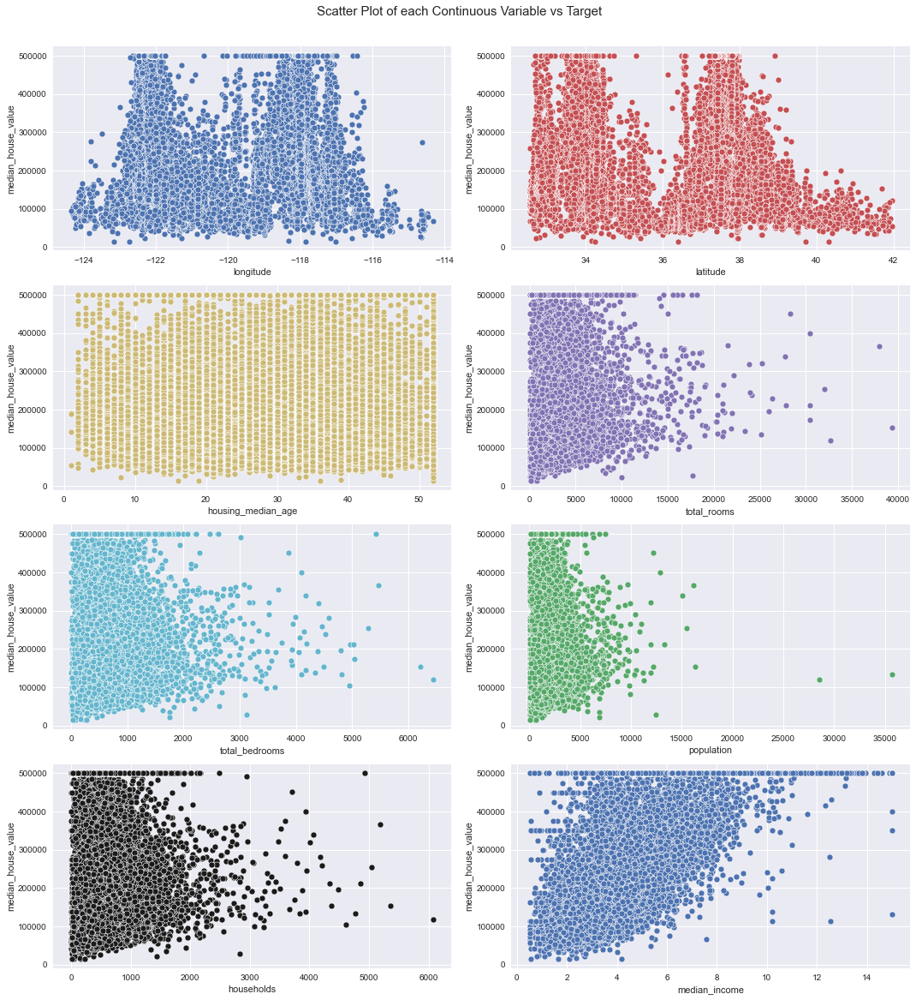

Number of All Scatter Plots = 36


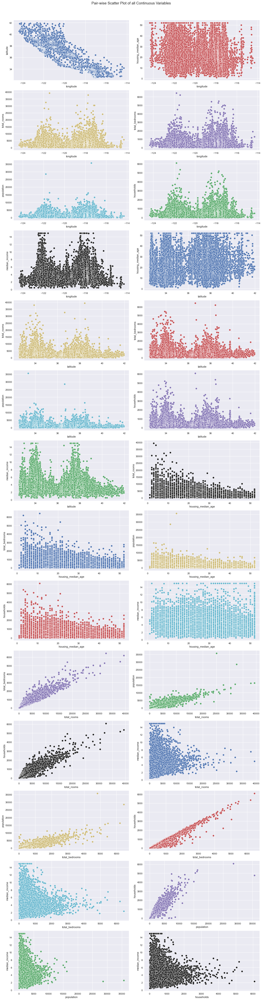

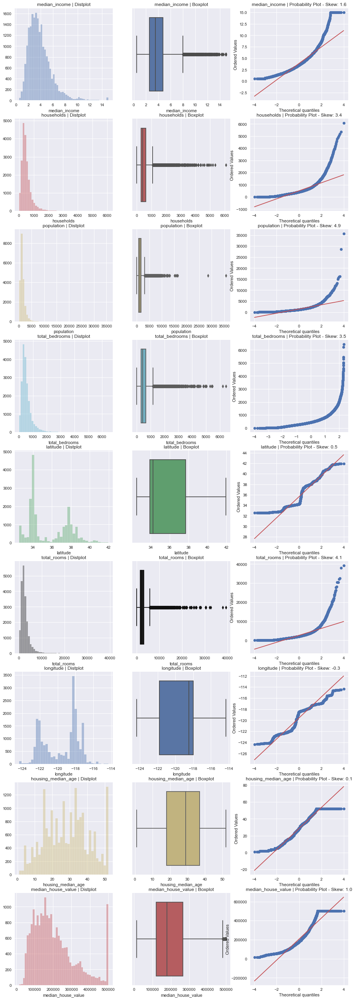

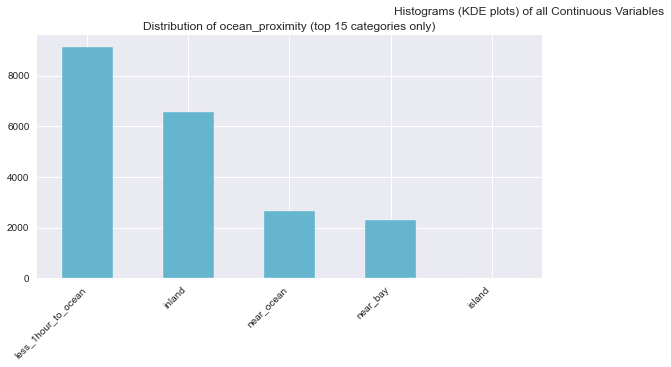

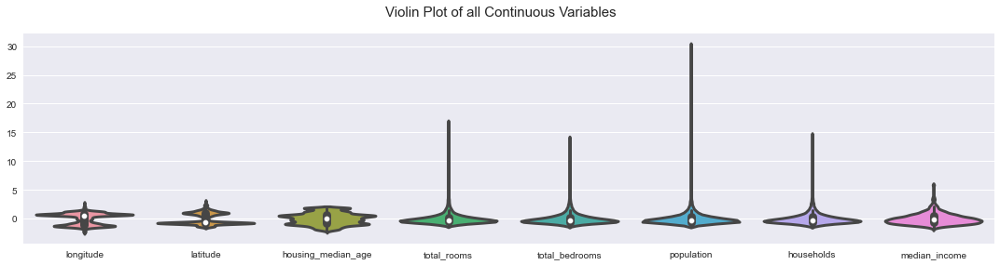

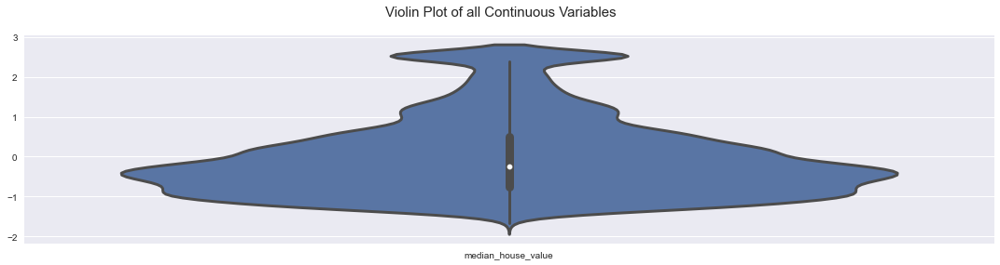

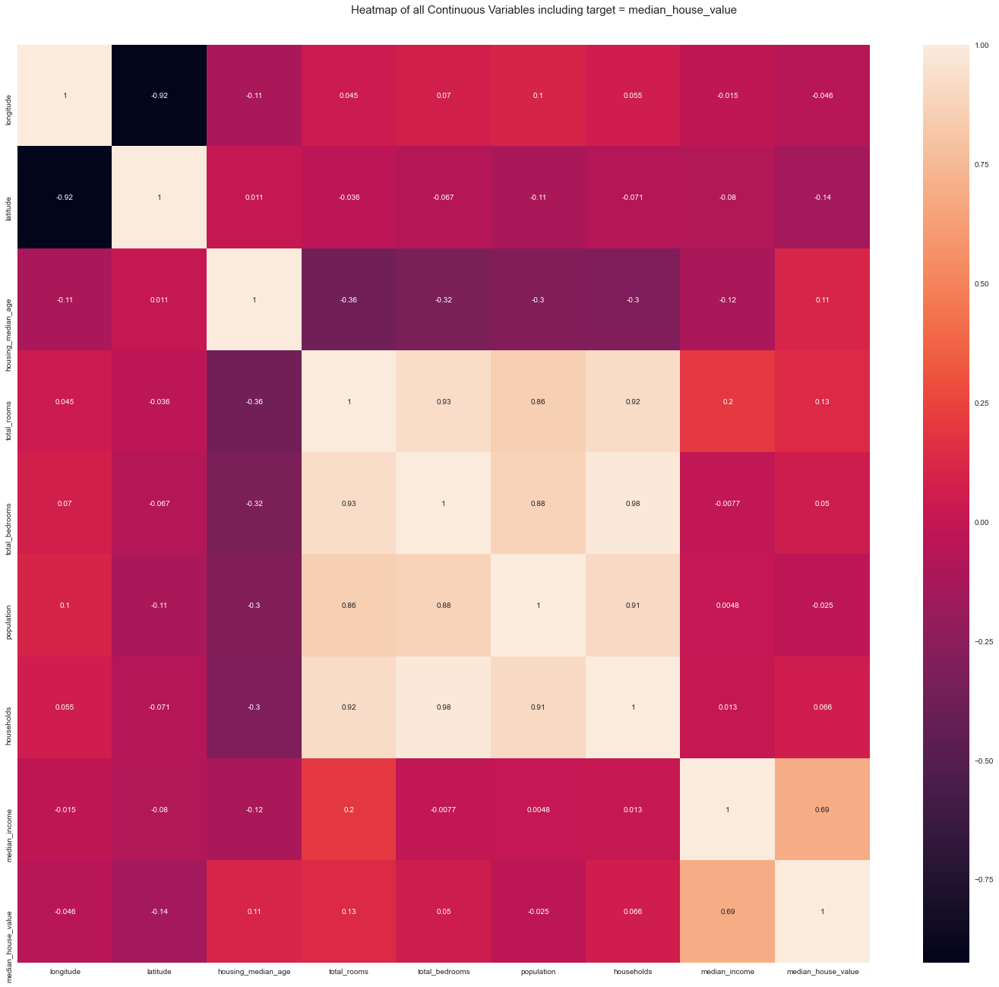

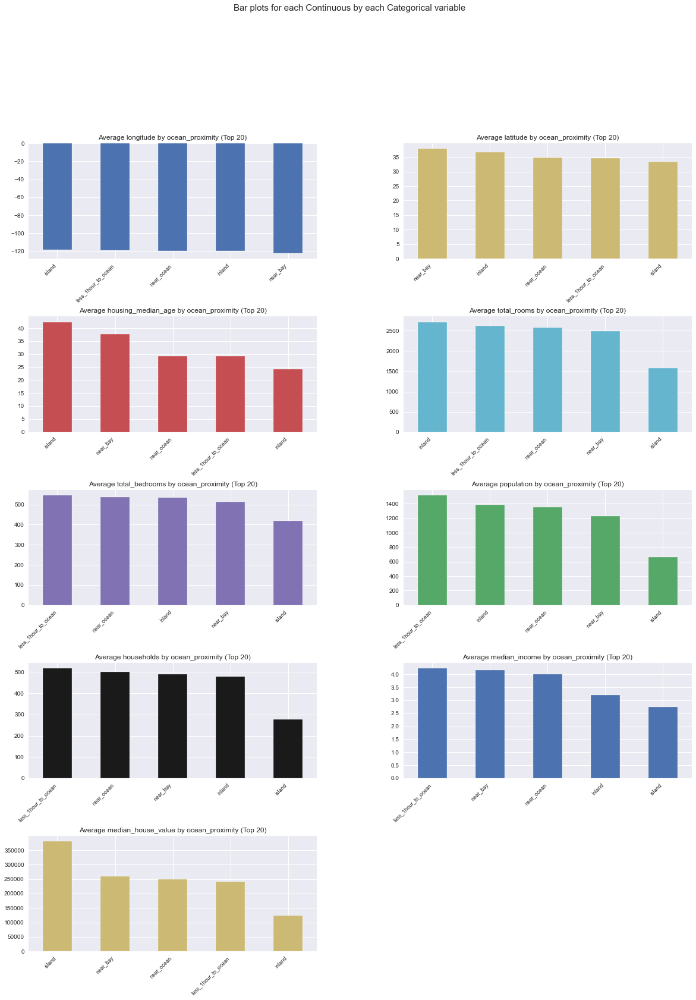

All Plots done
Time to run AutoViz (in seconds) = 28.002

 ###################### VISUALIZATION Completed ########################


In [6]:
# Checking the distributions of our main variables 
AV = AutoViz_Class()
dft = AV.AutoViz("", dfte=df, depVar = 'median_house_value')

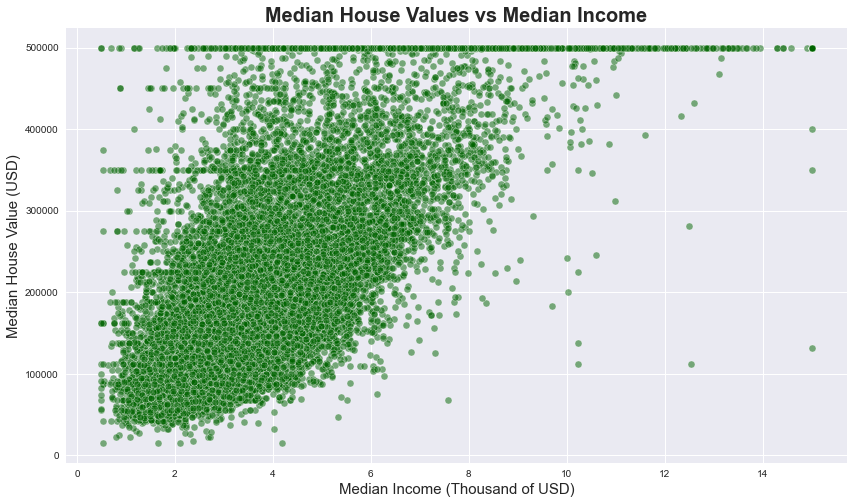

In [7]:
# Plotting the median house value vs Median Income, that seems to be the strongest relationship

plt.figure(figsize = (14,8))
plt.title("Median House Values vs Median Income", fontsize = 20, fontweight = 'bold')
sns.scatterplot(data = df, y = 'median_house_value', x = 'median_income', alpha = 0.5, color = 'darkgreen')
plt.ylabel("Median House Value (USD)", fontsize = '15')
plt.xlabel("Median Income (Thousand of USD)", fontsize = '15');

We seem to have some issues with the median house value: First of all, the maximum house value was clearly set as 500.000$, and all the houses more expensive than that "received" this amount. These records should be removed, since they have an incorrect target value and can mess up the algorithm.

A second problem is that we seem to have some horizontal lines in some specific points, such as 450.000$, 350.000$ and 275.000$. It looks very unnatural, and these values were probably misplaced. There are 2 options: We can simply drop all the records that have these values, or we could try to identify a threshold to each of these quirks, that the data seems incorrect after that point. 

Since the dataset is big enough, these values represent a small percentage of the data (around 1%). We'll just drop them. 

We already identified some issues with the dataset. Let’s clean it up!

## Cleaning the dataset
***

Before making the changes identified above, let's make the good old check for nulls

In [8]:
# Checking Nulls
df.isnull().sum()

# Code to check the correlation matrix (we'll not display them right now)
# df.corr()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

We have 207 records of missing values of "total bedrooms". This number is very small, and the missing values won’t jeopardize the model: pretty much every "classic" solution, such as dropping the rows, filling with the mean/median, etc. will give a similar result in the final model. 

For didactics purposes, let's make a little fancier solution:

The idea is to fill the null values with the median, after grouping them in some way. This solution is interesting, because using one value to the whole dataset might be problematic, as the numbers get farther from the median. Grouping the dataset in smaller intervals guarantees that we are inputting a median that is closer to the extreme values.

To the solution: First, checking the correlation matrix, the metric that is most similar to the “total bedrooms” is “households”. Therefore, we can use them to **group the records, before filling with the median**. This grouping will be made in “blocks” of 20 units (e.g. from 1~19 households ➡ group 1, 20 ~ 39 households ➡ group 2, etc)


In [9]:
## Grouping the data in blocks of 20 values
df['households_gp'] = df['households']//20

## Filling the null values with the median
df['total_bedrooms'] = df['total_bedrooms'].fillna(df.groupby('households_gp')['total_bedrooms'].transform('median'))

## Dropping the value used for grouping
df.drop('households_gp', axis = 1, inplace = True)

Okay, now let's fix some of the issues identified in the previous session: <br>

1) Create new features to guarantee that all of them are in the same unit (e.g. indicator per block) <br>
2) Data quirks


#### 1) First, let's create the new features, to make sure the information about rooms, bedrooms and population for each house are in the same "unit" as our target 

In [10]:
## Creating useful features

df["rooms_per_household"] = df["total_rooms"]/df["households"]
df["bedrooms_per_household"] = df["total_bedrooms"]/df["households"]
df["population_per_household"] = df["population"]/df["households"]

## Statistic description of the new variables
df[['rooms_per_household', 'bedrooms_per_household', 'population_per_household']].describe()

,rooms_per_household,bedrooms_per_household,population_per_household
count,20640.000000,20640.000000,20640.000000
mean,5.429000,1.096590,3.070655
std,2.474173,0.473748,10.386050
min,0.846154,0.333333,0.692308
25%,4.440716,1.006504,2.429741
50%,5.229129,1.048970,2.818116
75%,6.052381,1.098941,3.282261
max,141.909091,34.066667,1243.333333


In [11]:
df = df.drop(['total_rooms','total_bedrooms','population', 'households'], axis = 1)

Checking the new variables, the max values for "population_per_household" and "rooms_per_household" are very above the expectations. Digging a little deeper, we identified some rows with these extreme values, and will drop them in the next step. 

We are going to be extremely conservative here: A lot of records seem to have very high values, but we'll still give them the benefit of the doubt, and keep them in our data.

In [12]:
# Dropping outliers
df_cleaned = df.drop([1914,1979,3364,16669,19006]).reset_index(drop = True)

# New max values
display(pd.DataFrame(df_cleaned[['rooms_per_household', 'bedrooms_per_household', 'population_per_household']].describe()).iloc[7,:])

rooms_per_household          62.422222
bedrooms_per_household       15.312500
population_per_household    230.172414
Name: max, dtype: float64

#### 2) Now, let's eliminate the data quirks.

In [13]:
## Eliminating data quirks
df_cleaned =df_cleaned[~df_cleaned['median_house_value'].isin([450000,350000,275000,500000,500001])].reset_index(drop = True)

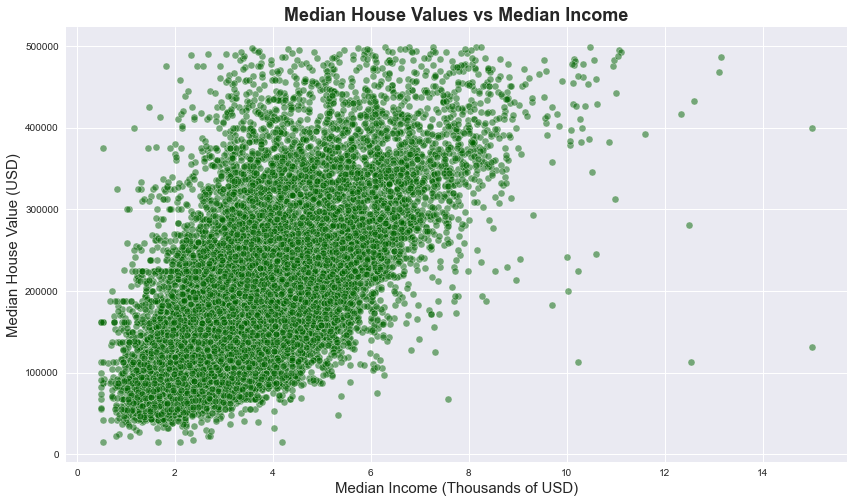

In [14]:
## Checking how our data looks after the changes

plt.figure(figsize = (14,8))
plt.title("Median House Values vs Median Income", fontsize = 18, fontweight = 'bold')
sns.scatterplot(data = df_cleaned, y = 'median_house_value', x = 'median_income', alpha = 0.5, color = 'darkgreen')
plt.xlabel("Median Income (Thousands of USD)", fontsize = 15)
plt.ylabel("Median House Value (USD)", fontsize = 15);

That looks way more natural!

That's all the cleaning for now, let's dig a little digger in our EDA.

## Exploratory Data Analysis
***


### Geospatial data

First of all, let’s see how our target behaves in a map. How important is the location to determine the median house value?
<br>*Note: we are going to use the original df, instead of the cleaned one, because even the 'dirty' data, will help us to understand some patterns*

In [15]:
## Creating a smaller sample to avoid polluting the map 
small_df = df.sample(frac = 0.4, random_state=seed)

## Plotting the map, using the mapbox api
mapbox_access_token =  'pk.eyJ1IjoiZGFuaWVsZWxpZXplciIsImEiOiJja2ZoYndyY3owMWtlMnVvN2Jwb3hqbTFtIn0.VHGksAhQ1blX1r0RUb9zMw'
px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(small_df, lat="latitude", lon="longitude", zoom=4, color="median_house_value",
                        color_continuous_scale=px.colors.diverging.RdBu_r, opacity = 0.2)
fig.show()

#### We can see some interesting things:

• Pretty much all the red spots (marking the more expensive houses) are relatively close to the ocean, which **highlights the importance of the ocean proximity in our analysis.** <br>
• Los Angeles, the cities near the Bay (especially in the west side), Santa Barbara and San Diego have a lot of blocks with expensive houses. <br>
• Even though the capital of the State is Sacramento, most of the blocks of the city have low-budget houses. <br>
• As we move from the ocean to the interior, the price of houses drops substantially. The fact that there's a lot of mountainous regions in the center/west might contribute to this behaviour. <br>
• **The north of the state almost pretty much doesn’t have red spots, even near the ocean.**

### Categorical Values: Ocean proximity

We were able to see very clearly on the map the importance of the geospatial position in determining the value of the house. In our model, the categorical value "ocean proximity" will also help a lot, since it's hard for some models to learn from latitude/longitude. Let's see the price of houses are related to this categories:

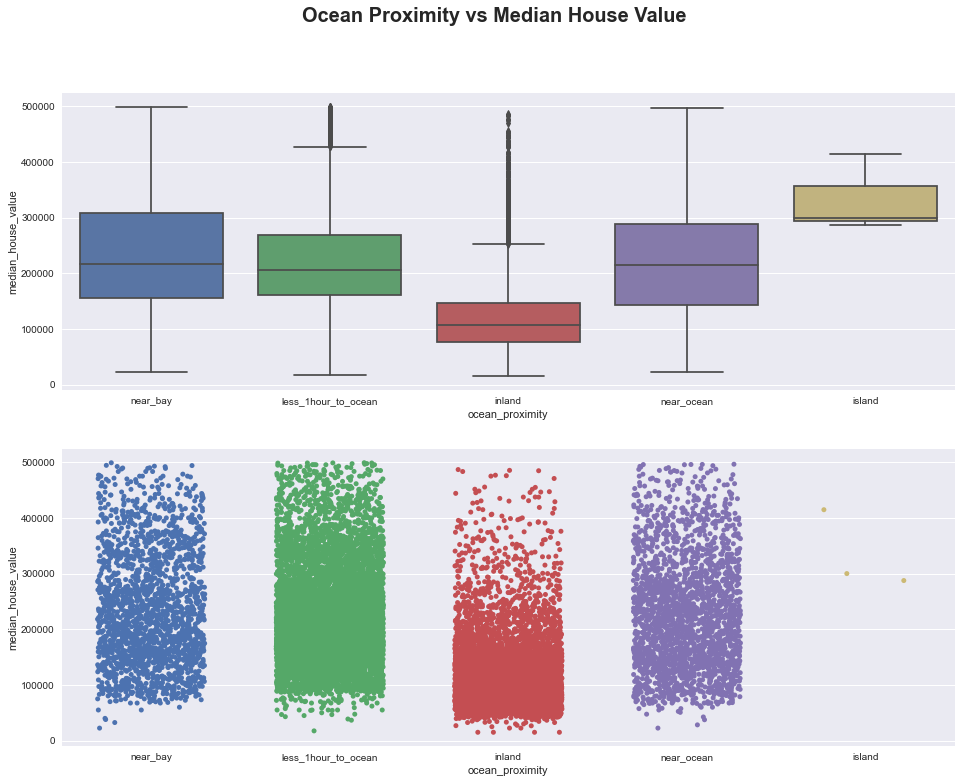

In [16]:
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

plt.suptitle('Ocean Proximity vs Median House Value', fontsize = 20, fontweight = 'bold')
sns.boxplot(ax=axes[0], data = df_cleaned, x="ocean_proximity", y="median_house_value")
sns.stripplot(ax=axes[1], data = df_cleaned, x='ocean_proximity',y='median_house_value',jitter=0.3)
plt.show();

In general, we can see that houses with the categories "next_to_bay" , "near_ocean" and "less_1h_to_ocean" are more expensive than those inland. Also, these categories has a wider range of prices. <br><br>
But can we do better than that? 

We noticed in the map that we had red spots all over the coast… except for the northern part of the state, where we had cheaper houses even on the coast.

Let’s try to create new categories to separate the north coast from the rest: Above the latitude of 38.20, we'll create new categories for the "near_ocean" and "less_1h_to_ocean".

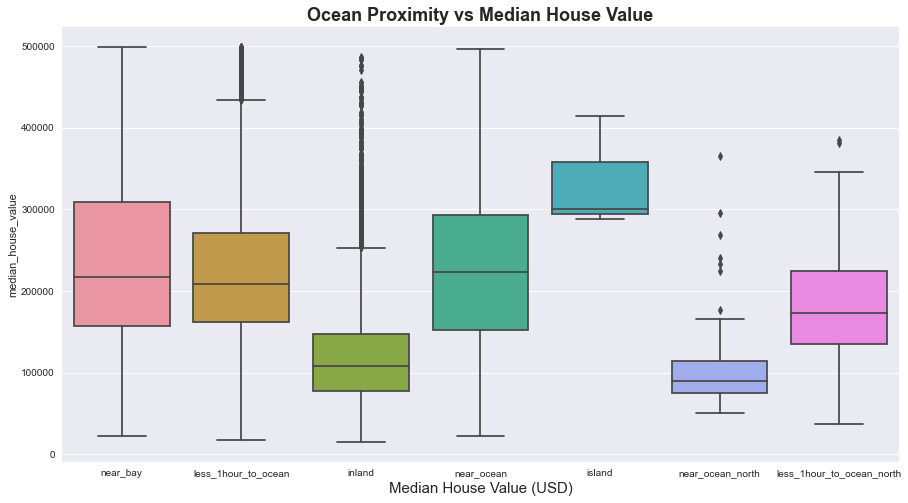

In [17]:
## creating a new df with the ocean category changed

df_cleaned_ocean_loc = df_cleaned.copy()
df_cleaned_ocean_loc2 = df_cleaned.copy()

df_cleaned_ocean_loc['ocean_proximity_new'] = df_cleaned_ocean_loc['ocean_proximity'] 
df_cleaned_ocean_loc.loc[(df_cleaned_ocean_loc['ocean_proximity']=='less_1hour_to_ocean')&(df_cleaned_ocean_loc['latitude'] > 38.2),'ocean_proximity_new'] = 'less_1hour_to_ocean_north'
df_cleaned_ocean_loc.loc[(df_cleaned_ocean_loc['ocean_proximity']=='near_ocean')&(df_cleaned_ocean_loc['latitude'] > 38.2),'ocean_proximity_new'] = 'near_ocean_north'

# putting the new categories in the end of the dataframe 
_ = pd.concat([df_cleaned_ocean_loc[df_cleaned_ocean_loc['ocean_proximity'] == df_cleaned_ocean_loc['ocean_proximity_new']], df_cleaned_ocean_loc[df_cleaned_ocean_loc['ocean_proximity'] != df_cleaned_ocean_loc['ocean_proximity_new']]])

fig = plt.figure(figsize=(15,8))
plt.title('Ocean Proximity vs Median House Value', fontsize = 18, fontweight = 'bold')
sns.boxplot(data = _, x="ocean_proximity_new", y="median_house_value");
plt.xlabel('Ocean Proximity', fontsize = 15)
plt.xlabel('Median House Value (USD)', fontsize = 15)

df_cleaned_ocean_loc = df_cleaned_ocean_loc.drop("ocean_proximity", axis = 1)

That good! For both new categories, we could see a big difference between the northern data and the "southern" data.

We'll keep these changes in a separated dataset, and see if it can help the machine learning models.

In [18]:
#RMSE

### Numerical Data

Let's plot the correlation matrix, to see how the numerical variables are related to each other

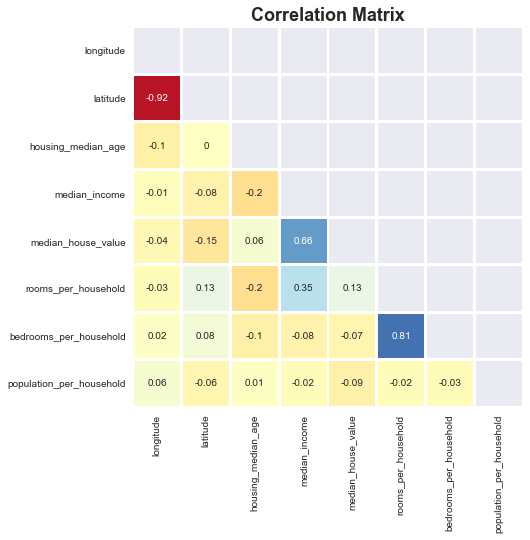

In [19]:
## Checking the correlation matrix

corr_mat = df_cleaned.corr().round(2)
f, ax = plt.subplots(figsize=(7,7))
mask = np.zeros_like(corr_mat,dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_mat,mask=mask,vmin=-1,vmax=1,center=0, 
               cmap='RdYlBu',square=False,lw=2,annot=True,cbar=False);
plt.title("Correlation Matrix", fontsize = 18, fontweight = 'bold')
plt.show()  


Taking a look at our correlation matrix, there aren’t many big discoveries. All the strong relations were kind of obvious and we could see it coming: the more people live on a block, the more rooms there are. The more households there are in a block, the more bedrooms there are, etc. The more useful (but also a little obvious) information we could extract is that: **the higher the median household income, the more expensive the house.**

Let me open a quick parenthesis: One interesting thing is that the coefficient for median house age and median house value is slightly positive: The older the house, the more expensive it is. Of course, knowing the context, we might suspect that this doesn’t actually make sense.

Digging a little deeper, we can see why:

In [20]:
temporary_df = df_cleaned.copy()
temporary_df['housing_median_age_group'] = temporary_df['housing_median_age']//10*10
temporary_df = temporary_df.groupby(['housing_median_age_group', 'ocean_proximity']).count()[['longitude']].rename({'longitude':'count'}, axis = 1).reset_index()
temporary_df['percentage'] = 100*temporary_df['count']/temporary_df.groupby('housing_median_age_group')['count'].transform(np.sum)
fig = px.bar(temporary_df, x="housing_median_age_group", y="percentage", color="ocean_proximity",
             title="Percentage of Houses per Location grouped by Age",
             labels={"housing_median_age_group": "Median Age Group", "percentage": "Percentage of Houses"})

fig.show()

The newer the house, higher is the probability that it is located "inland", which we had already noticed is a location where houses are not as costly as the ones closer to the ocean. 
That's why we can have the idea that older houses are more expensive. Taking in consideration houses within the same block, this correlation is unlikely to hold. <br>
<br> **This highlights how difficult this exploratory data analysis can be. Sometimes it is very hard to find hidden patterns in our data, and knowing about the business is a very good way to collect insights.**

### Continuing with our EDA

Let's take another look at the relation between the median income and median house values, since they have a strong relationship.

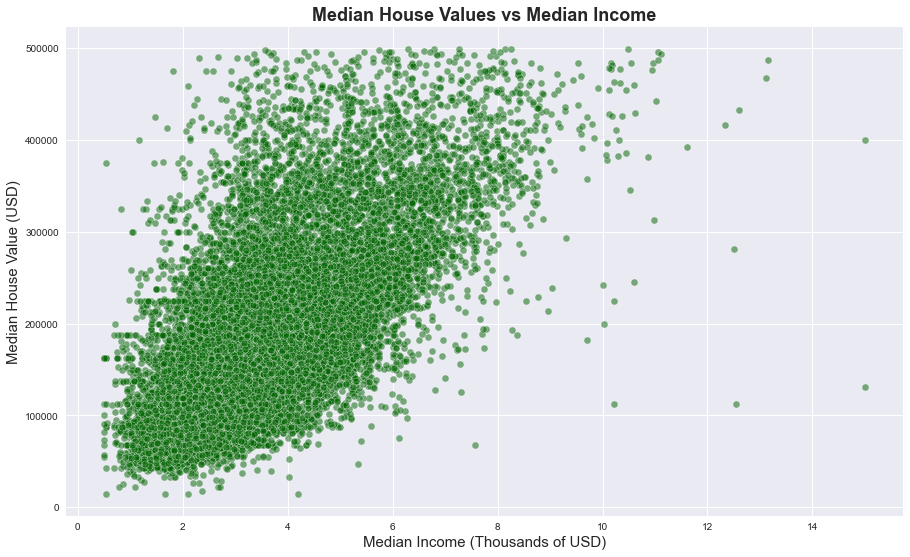

In [21]:
plt.figure(figsize = (15,9))
plt.title("Median House Values vs Median Income", fontsize = 18, fontweight = 'bold')
sns.scatterplot(data = df_cleaned, y = 'median_house_value', x = 'median_income', alpha = 0.5, color = 'darkgreen')
plt.xlabel('Median Income (Thousands of USD)', fontsize = 15)
plt.ylabel('Median House Value (USD)', fontsize = 15);

We can spot a 'cone' form that might not be great for the linear model. This effect also appears in other relations. In some cases, using the logarithm of the features can help the model to make better predictions. Let's create a separated dataframe, to check these new log-transformed features can help.

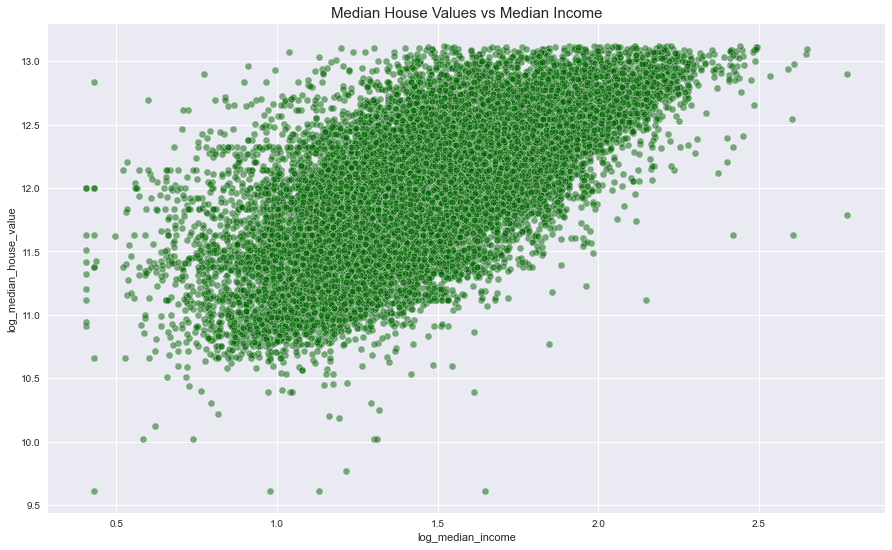

In [22]:
# Creating a log dataframe 
list_log = ['housing_median_age', 'median_income',
    'median_house_value','rooms_per_household','population_per_household','bedrooms_per_household']

df_with_log = df_cleaned.copy()
for col in list_log:
    name_log = 'log_' + str(col)
    df_with_log[name_log] = np.log(df_with_log[col] + 1)   
    
# Plotting the log of the Median Income vs log Median House Value
plt.figure(figsize = (15,9))
plt.title("Median House Values vs Median Income", fontsize = 15)
sns.scatterplot(data = df_with_log, y = 'log_median_house_value', x = 'log_median_income', alpha = 0.5, color = 'darkgreen');

In [23]:
## Comparing the pearson correlation coefficient with and without the log
df_with_log.corr().loc[['median_house_value','log_median_house_value'], ['median_income','log_median_income']]

,median_income,log_median_income
median_house_value,0.662462,0.647007
log_median_house_value,0.653569,0.664769


For the log features, the Pearson Coefficient is slightly better. We'll check in the next steps if using those can have a positive impact in our model. 

## Building our first Machine Learning Model

In this session, we'll try to come with some answers:

• What is the best kind of model for our problem (linear, tree-based, SVR, Neighbors-based)? 
<br>
• Applying the log in our numerical data enhances the model? What if the variables were scaled?

First of all, we'll have to transform the ocean_proximity column, since some models don't handle categorical variables very well. We are going to use the one-hot-encoding method.

In [24]:
## Creating dummy variables to the ocean proximity column

df_cleaned = pd.get_dummies(df_cleaned, columns=['ocean_proximity']).drop("ocean_proximity_island", axis = 1)
df_with_log = pd.get_dummies(df_with_log, columns=['ocean_proximity']).drop("ocean_proximity_island", axis = 1)

Now, we are going to select one model of each type (between linear, tree-based, neighbors and SVR) to see which performs better, and how that performance changes with some transformations (log-transformation and standardizing the variables).

In [25]:
dict_modelos ={
    'LinearRegression':LinearRegression,      # linear model
    'KNeighbors': KNeighborsRegressor,        # neighbors
    'RandomForest': RandomForestRegressor,    # tree-based
    'SVR':svm.SVR                             # SVR
    }

    
# creating dict to store the results from each model, with the transformations
result_models = {}
result_models_std = {}
result_models_log = {}
result_models_std_log = {}


# no log and no std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_cleaned, value, std_scaler = False)
    result_models[key] = r2


# no log and with std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_cleaned, value, std_scaler = True)
    result_models_std[key] = r2


# with log and no std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_with_log, value, std_scaler = False, log = True)
    result_models_log[key] = r2


# with log and with std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_with_log, value, std_scaler = True, log = True)
    result_models_std_log[key] = r2
    

# joining the results in a single df
df_results = pd.DataFrame([result_models, result_models_std, result_models_log, result_models_std_log])
df_results.index = ['no_std_no_log', 'with_std_no_log', 'no_std_with_log', 'with_std_with_log']
df_results

,LinearRegression,KNeighbors,RandomForest,SVR
no_std_no_log,0.598,0.688,0.797,-0.023
with_std_no_log,0.598,0.729,0.797,-0.012
no_std_with_log,0.630,0.689,0.799,0.548
with_std_with_log,0.630,0.721,0.799,0.764


Looking at the results, we could see that the linear models were not great. Our attempt to use the log in the numerical variables did improve the model, but the R² values were far behind other options. 

Using the standard scaling were very important to some types of model, like the SVR and KNeighbors. In the linear and tree-based, it didn't seem to make a big difference.

The model that had the best performance was the tree-based. How much can we improve it? 

## Optimising the Machine Learning Model
***

Now, our goal is to increase the performance of the tree-based model regardless of how it looks to the others (linear, SVR, neighbors-based).

We'll make some attempts to get a better result: removing variables, creating new ones, and performing a hyperparameter optimization. Finally, we'll check if there is some other tree-based model that can outperform the Random Forest.

*Note: For now on we'll use cross validation to evaluate the model, as we seek for more reliability that our changes are helping the model, and that's not due to randomness. Therefore, we must re-evaluate the model to get a new baseline with cross-validation.*

In [26]:
# Baseline model: We are re-running it since now we are using cross validation
run_and_evaluate_model_cv(df_cleaned, RandomForestRegressor(random_state = seed))

The R² of the model is: 0.8


First of all, let's check which features were more important to the Random Forest model to evaluate the results. We can try to remove the least important ones, to see if it improves the model. 

### Removing least important features

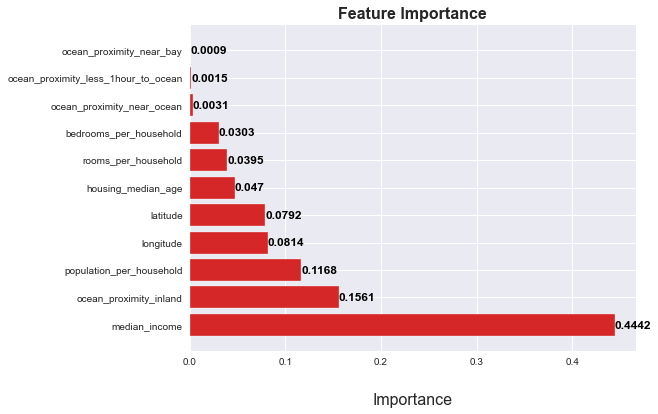

In [27]:
# Checking the feature importances
y = df_cleaned["median_house_value"]
x = df_cleaned.drop(["median_house_value"], axis=1, errors = 'ignore')
   
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(x, y)

fi_df = pd.DataFrame({"FEATURE": list(x.columns), "IMPORTANCE": rf_model.feature_importances_})        
fi_df = fi_df.sort_values("IMPORTANCE", ascending=False).reset_index(drop = True)

plt.figure(figsize=(8, 6))
plt.barh(y=fi_df['FEATURE'], width=fi_df['IMPORTANCE'], color ="tab:red")
plt.title('Feature Importance', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=16, labelpad=25)

for index, value in enumerate(fi_df["IMPORTANCE"].round(4)):
    plt.text(value, index, str(value), color='black', fontweight="bold", fontsize=12, verticalalignment='center')

plt.show()

In [28]:
# Removing least important features
run_and_evaluate_model_cv(df_cleaned.drop(['ocean_proximity_near_bay','ocean_proximity_less_1hour_to_ocean','ocean_proximity_near_ocean'], axis = 1), RandomForestRegressor(random_state = seed))

The R² of the model is: 0.799


Sometimes, removing the least important features gives the model better results. After evaluating the model after removing some combinations of features (removing the worst, removing the 2nd worst, removing the 2, and so on), we couldn't get results better than the baseline. We'll just move on with all of the original features.

### Creating new features

Now let's see how the random forrest model performed in the "df_cleaned_ocean_loc" dataset, where we created additional categories for the ocean proximity data, separating the Northern part of the state of the others, as discussed previously.

In [29]:
# Evaluating the df_cleaned_ocean_loc dataset
df_cleaned_ocean_loc = pd.get_dummies(df_cleaned_ocean_loc, columns=['ocean_proximity_new']).drop("ocean_proximity_new_island", axis = 1)
run_and_evaluate_model_cv(df_cleaned_ocean_loc, RandomForestRegressor(random_state = seed))


The R² of the model is: 0.8


That's not what we were expecting. The changes didn't seem to have improved the tree based-model (even though it improves the linear model)

Maybe we can do better than that: Let's try to use K-Means to cluster the data, and create a new 'cluster' variable with these results to improve the model.

### Creating a geographic cluster feature

Since the main goal here is to help the model with the geospatial data, we are going to fit the algorithm only with the values of latitude and longitude. That way, the different clusters won't overlap in the map. 

At this point, we'll have some technical challenges here: We'll need to build a pipeline, to prevent data leakage (when the information outside the training set is used to create the model). Not only that, having a pipeline will make it easier to optimize the hyperparameters, since we'll try to get the best combination between the parameters from the KMeans model, and the regression model itself.

To use the pipeline from sklearn, we'll need to create a class that uses the KMeans as a transformation step that will create a new feature to pass to the main model. We're going to be super-creative and call it KMeansTransformer.

In [30]:
class KMeansTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, n_clusters=25, max_iter = 200, random_state = seed):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = seed
        self.model = KMeans(n_clusters, random_state = seed, max_iter = max_iter)

    def fit(self,X,y=None):
        self.model.fit(X[['latitude','longitude']])
    
    
    def transform(self,X,y=None):
        X['cluster']= self.model.predict(X[['latitude','longitude']]).reshape(-1,1)
        return X
    
    def fit_transform(self, X, y=None):
        self.fit(X[['latitude','longitude']])
        return self.transform(X)

pipe = Pipeline([("clusterization", KMeansTransformer(random_state = seed)),
                 ("regressor", RandomForestRegressor(random_state = seed))])
run_and_evaluate_model_cv(df_cleaned, pipe)

The R² of the model is: 0.804


That’s good news! Using the KMeans to create a ‘cluster’ column seems to help the model! Just out of curiosity, let’s see how these clusters look on the map. We established an initial number of clusters of 25, in the optimization process, that number might change.

In [31]:
df_cleaned_cluster = df_cleaned.copy()
KMT30 = KMeansTransformer(n_clusters = 25, random_state = seed)
KMT30.fit_transform(df_cleaned_cluster)

mapbox_access_token =  'pk.eyJ1IjoiZGFuaWVsZWxpZXplciIsImEiOiJja2ZoYndyY3owMWtlMnVvN2Jwb3hqbTFtIn0.VHGksAhQ1blX1r0RUb9zMw'
px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(df_cleaned_cluster, lat="latitude", lon="longitude", zoom=4, color="cluster",
                        color_continuous_scale=px.colors.diverging.RdBu_r, opacity = 0.2)
fig.show()

### Hyperparameter Optimization

Now let's try to optimize it using Bayesian optimization. In this method, we'll feed the model a range of values of the hyperparameters that we want to tune, and it will randomly search for the combination of values that gives the best result. After some random iterations, we'll find the best combination, and the algorithm will keep searching for values near this spot, using gaussian processes.

First, we'll try to tune the hyperparameters of the Random Forest model. Since this process takes a couple of hours, I'll just write the code used (as a comment), and create and evaluate the optimized pipeline with the results of the bayesian optimization.


In [32]:
#### Code used for the optimization
#
# def train_model_rf(params):
#     n_clusters = params[0]
#     n_estimators = params[1]
#     min_samples_leaf = params[2]
#     max_depth = params[3]
#     max_features = params[4]
#     
#     print(params, '\n')
#     mdl = Pipeline([("clusterization", KMeansTransformer(n_clusters = n_clusters)),
#                     ("regressor", RandomForestRegressor(n_estimators = n_estimators,
#                                            min_samples_leaf = min_samples_leaf,
#                                            max_depth = max_depth,
#                                            max_features = max_features))])
#     mdl.fit(X, y)
#     folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
#     scores = cross_val_score(mdl, X, y, cv=folds)
#     return -round(np.mean(scores),3)
#
# space_rf = [[10,15,20,25,30,35, 40], # n_cluster
#          [100,200,400,800,1200,1600,2000,2400, 2700], # n_estimators
#          [1,2,3,4,5,10,15,22,30], # min sample leaf
#          [None], # max_depth
#         ['auto','sqrt','log2']] # max_features
# resultados_gp = gp_minimize(train_model_rf, space_rf, random_state=seed, verbose=1, n_calls=37, n_random_starts=25)
# resultados_gp.x

In [33]:
pipe_rf = Pipeline([("clusterization", KMeansTransformer(random_state = seed, n_clusters = 25)),
                ("regressor", RandomForestRegressor(random_state = seed, 
                                                    n_estimators = 800,
                                                   min_samples_leaf = 1,
                                                   max_depth = None,
                                                   max_features = 'log2'))])
run_and_evaluate_model_cv(df_cleaned, pipe_rf)


The R² of the model is: 0.825


That was a very significative improvement: We went from 0.804 to 0.825! 

### Trying another type of model

Let's see if using the Xgboost can return a better result. Again, we'll use the baesyan optimization, and display only the final result.

In [34]:
# Again, the baesyan optimization will be set as a comment
# 
# 
# def train_model_xgb(params):
#     n_clusters = params[0]
#     n_estimators = params[1]
#     learning_rate = params[2]
#     max_depth = params[3]
#     min_child_weight = params[4]
#     subsample = params[5]
#     num_parallel_tree = params[6]
#     
#     print(params, '\n')
#     mdl = Pipeline([("clusterization", KMeansTransformer(n_clusters = n_clusters)),
#                     ("regressor", XGBRegressor(n_estimators = n_estimators,
#                                            learning_rate = learning_rate,
#                                            max_depth = max_depth,
#                                            min_child_weight = min_child_weight,
#                                            subsample = subsample,
#                                            num_parallel_tree = num_parallel_tree))])
#     mdl.fit(X, y)
#     folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
#     scores = cross_val_score(mdl, X, y, cv=folds)
#     return -round(np.mean(scores),3)
#
#  space_xgb = [list(range(15, 40)), # n_cluster 
#           list(range(100, 2400)), # n_estimators
#           loguniform.rvs(1e-3, 1, size=1000, random_state=seed), # learning_rate
#           list(range(2, 7)), # max_depth
#           list(range(2, 30)), # min_child_weight
#           np.linspace(0.05, 1).tolist(), # subsample
#           list(range(2, 5))] # num_parallel_tree
# resultados_gp = gp_minimize(train_model_xgb, space_xgb, random_state=seed, verbose=1, n_calls=60, n_random_starts=40)
# resultados_gp.x

In [35]:
## XGB optimized
y = df_cleaned['median_house_value']
X = df_cleaned.drop(['median_house_value'], axis = 1)

pipe_xgb_tuned = Pipeline([("clusterization", KMeansTransformer(n_clusters = 32)),
                ("regressor", XGBRegressor(
                                       random_state = seed,
                                       n_estimators = 1085,
                                       learning_rate = 0.10595107822603367,
                                       max_depth = 5,
                                       min_child_weight = 15,
                                       subsample = 0.786734693877551,
                                       num_parallel_tree = 3))])

run_and_evaluate_model_cv(df_cleaned, pipe_xgb_tuned) 

The R² of the model is: 0.844


We have our final model! The XGBoost had a much better performance than the Random Forest

### Which kind of features were more helpful?

Finally, we have our final model. Just out of curiosity, let's see what kind of features are more important to make the predictions: Features about the geographic location? About the house and number of residents? The income of the family?

We'll run the model in these 3 cenarios, where in each one, we'll remove the features related.

In [36]:
## no info about the house

df_without_house_info = df_cleaned.drop(['housing_median_age',
       'rooms_per_household', 'bedrooms_per_household',
       'population_per_household'], axis = 1)

y = df_without_house_info['median_house_value']
X = df_without_house_info.drop(['median_house_value'], axis = 1)

pipe_xgb_tuned.fit(X, y)
folds = KFold(n_splits = 4, shuffle = True, random_state = seed)

run_and_evaluate_model_cv(df_without_house_info, pipe_xgb_tuned)

The R² of the model is: 0.823


In [37]:
## no info about the income

df_without_income_info = df_cleaned.drop(['median_income'], axis = 1)

y = df_without_income_info['median_house_value']
X = df_without_income_info.drop(['median_house_value'], axis = 1)

pipe_xgb_tuned.fit(X, y)

folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
run_and_evaluate_model_cv(df_without_income_info, pipe_xgb_tuned)

The R² of the model is: 0.832


In [38]:
## no info about the location

df_without_location = df_cleaned.drop(['latitude','longitude','ocean_proximity_inland',
       'ocean_proximity_less_1hour_to_ocean', 'ocean_proximity_near_bay',
       'ocean_proximity_near_ocean'], axis = 1)

xgbmodel = XGBRegressor(random_state = seed,
                        n_estimators = 1085,
                        learning_rate = 0.10595107822603367,
                        max_depth = 5,
                        min_child_weight = 15,
                        subsample = 0.786734693877551,
                        num_parallel_tree = 3)



run_and_evaluate_model_cv(df_without_location, xgbmodel)


The R² of the model is: 0.621


This is curious! These experiments showed that the locaton of the house is the most important attribute to explain it's price. Even though the correlation between the income of the family and the house price were very high, turns out that this attribute was not so important at the end of the day.

Thanks for reading!